In [80]:
import pandas as pd
import numpy as np
from pandas_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from statsmodels.stats.outliers_influence import variance_inflation_factor
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import chi2
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb 
from xgboost import XGBRegressor


In [3]:
####Load dataset
dset = pd.read_csv("day.csv")

In [4]:
dset.dtypes

instant         int64
dteday         object
season          int64
yr              int64
mnth            int64
holiday         int64
weekday         int64
workingday      int64
weathersit      int64
temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object

In [43]:
dset.shape

(731, 16)

In [58]:
dset.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [57]:
dset.head(5)

,instant,dteday,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt
0,1,2011-01-01,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985
1,2,2011-01-02,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801
2,3,2011-01-03,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349
3,4,2011-01-04,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562
4,5,2011-01-05,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600


In [5]:
dset["dteday"] = pd.to_datetime(dset["dteday"])

In [6]:
###Converting relevant features to categorical
dset["season"] = pd.Categorical(dset["season"], ordered = False)
dset["yr"] = pd.Categorical(dset["yr"], categories={0 :'2010', 1:'2011'}, ordered = False)
dset['mnth'] = pd.Categorical(dset['mnth'], ordered=False)
dset['holiday'] = pd.Categorical(dset['holiday'], ordered=False)
dset['weekday'] = pd.Categorical(dset['weekday'], ordered=False)
dset['workingday'] = pd.Categorical(dset['workingday'], ordered=False)
dset['weathersit'] = pd.Categorical(dset['weathersit'], ordered=False)

In [244]:
dset["yr"].cat.categories

Int64Index([0, 1], dtype='int64')

In [59]:
dset.profile_report()

In [7]:
######Getting numerical data#######33
numerical_data = dset.select_dtypes(include=['float64', 'int64'])

In [8]:
numerical_data.drop(['instant'], inplace=True, axis=1)

C:\Users\Mayank\anaconda3\lib\site-packages\pandas\core\frame.py:3990: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [9]:
numerical_data.dtypes

temp          float64
atemp         float64
hum           float64
windspeed     float64
casual          int64
registered      int64
cnt             int64
dtype: object

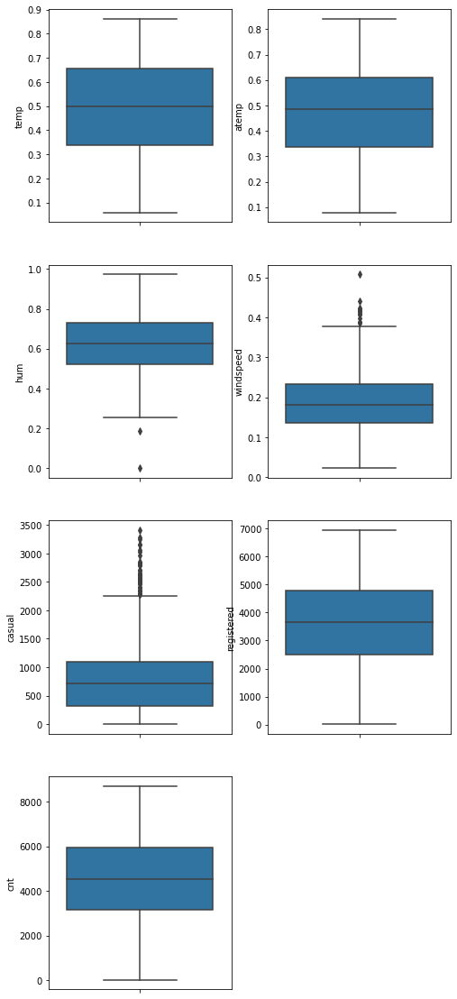

In [10]:
######Boxplots for numerical variables
count = 1
plt.subplots(figsize=(8, 20))
for i in numerical_data.columns:
    plt.subplot(4, 2, count)
    sns.boxplot(y = numerical_data[i])
    count += 1

plt.show()

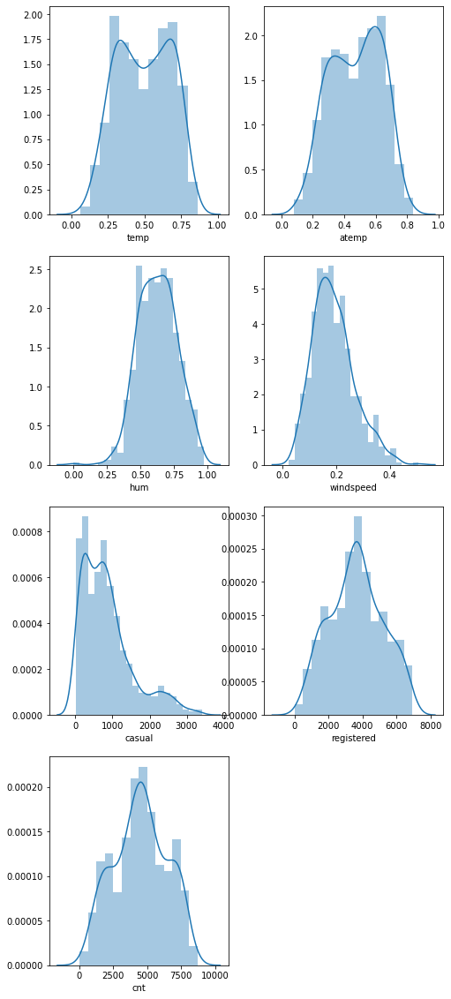

In [248]:
###Distribution of numerical variables
count = 1
plt.subplots(figsize=(8, 20))
for i in numerical_data.columns:
    plt.subplot(4, 2, count)
    sns.distplot(numerical_data[i])
    count += 1

plt.show()

In [11]:
######Outlier Analysis
upper_bound = []
lower_bound = []
for col in numerical_data.columns:
    upper_bound.append(numerical_data[col].quantile(0.75) + 1.5*(numerical_data[col].quantile(0.75)-numerical_data[col].quantile(0.25)))
    lower_bound.append(numerical_data[col].quantile(0.25) - 1.5*(numerical_data[col].quantile(0.75)-numerical_data[col].quantile(0.25)))
Range_data = pd.DataFrame({'Var_Name': numerical_data.columns,
                         'Upper_Bound': upper_bound,
                          'Lower_Bound': lower_bound})
                       

In [12]:
Range_data

,Var_Name,Upper_Bound,Lower_Bound
0,temp,1.132916,-0.140416
1,atemp,1.014741,-0.068297
2,hum,1.045521,0.204687
3,windspeed,0.380611,-0.012447
4,casual,2266.750000,-855.250000
5,registered,8195.750000,-922.250000
6,cnt,10162.000000,-1054.000000


In [13]:
dset.describe()

,instant,temp,atemp,hum,windspeed,casual,registered,cnt
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,366.000000,0.495385,0.474354,0.627894,0.190486,848.176471,3656.172367,4504.348837
std,211.165812,0.183051,0.162961,0.142429,0.077498,686.622488,1560.256377,1937.211452
min,1.000000,0.059130,0.079070,0.000000,0.022392,2.000000,20.000000,22.000000
25%,183.500000,0.337083,0.337842,0.520000,0.134950,315.500000,2497.000000,3152.000000
50%,366.000000,0.498333,0.486733,0.626667,0.180975,713.000000,3662.000000,4548.000000
75%,548.500000,0.655417,0.608602,0.730209,0.233214,1096.000000,4776.500000,5956.000000
max,731.000000,0.861667,0.840896,0.972500,0.507463,3410.000000,6946.000000,8714.000000


In [14]:
######Setting outliers to NaN
dset['windspeed'].loc[lambda x: x > 0.380611] = np.nan
dset['casual'].loc[lambda x: x > 2266] = np.nan
dset['hum'].loc[lambda x: x < 0.204687] = np.nan


C:\Users\Mayank\anaconda3\lib\site-packages\pandas\core\indexing.py:671: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [15]:
dset['cnt'].loc[dset['casual'].isnull()] = np.nan
dset.isnull().sum()

instant        0
dteday         0
season         0
yr             0
mnth           0
holiday        0
weekday        0
workingday     0
weathersit     0
temp           0
atemp          0
hum            2
windspeed     13
casual        44
registered     0
cnt           44
dtype: int64

In [16]:
dset.dtypes

instant                int64
dteday        datetime64[ns]
season              category
yr                  category
mnth                category
holiday             category
weekday             category
workingday          category
weathersit          category
temp                 float64
atemp                float64
hum                  float64
windspeed            float64
casual               float64
registered             int64
cnt                  float64
dtype: object

In [17]:
######Preparing data for KNN Imputation
data_knn = dset.drop(['instant', 'dteday', 'cnt', 'registered'], axis=1)
data_knn.dtypes
data_knn.shape

(731, 12)

In [18]:
#######KNN Imputation
imputer = KNNImputer()
print(data_knn.iloc[27, 11]) ##38.0
data_knn.iloc[27, 11] = np.nan
dset_knn = imputer.fit_transform(data_knn)

38.0


In [19]:
dset_knn = pd.DataFrame(data = dset_knn, columns = data_knn.columns)

In [20]:
dset_knn.iloc[27, 11]

98.6

In [21]:
dset['hum'] = dset_knn['hum']
dset['windspeed'] = dset_knn['windspeed']
dset['casual'] = dset_knn['casual']

In [22]:
dset['cnt'] = dset.apply(lambda x: x['casual'] + x['registered'], axis=1)

In [23]:
dset.describe()

,instant,temp,atemp,hum,windspeed,casual,registered,cnt
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,366.000000,0.495385,0.474354,0.629430,0.186535,784.895212,3656.172367,4441.067579
std,211.165812,0.183051,0.162961,0.139594,0.071263,553.245742,1560.256377,1869.444464
min,1.000000,0.059130,0.079070,0.254167,0.022392,2.000000,20.000000,22.000000
25%,183.500000,0.337083,0.337842,0.522291,0.134646,315.500000,2497.000000,3152.000000
50%,366.000000,0.498333,0.486733,0.627500,0.179729,710.000000,3662.000000,4511.000000
75%,548.500000,0.655417,0.608602,0.730209,0.230098,1075.500000,4776.500000,5812.400000
max,731.000000,0.861667,0.840896,0.972500,0.378108,2258.000000,6946.000000,8173.000000


In [24]:
dset.isnull().sum()

instant       0
dteday        0
season        0
yr            0
mnth          0
holiday       0
weekday       0
workingday    0
weathersit    0
temp          0
atemp         0
hum           0
windspeed     0
casual        0
registered    0
cnt           0
dtype: int64

In [25]:
####Dropping irrelevant and redundant features
dset.drop(['instant', 'dteday'], inplace=True, axis=1)

In [26]:
dset.profile_report()

In [27]:
##Getting Categorical Data
cat_data = dset.select_dtypes(include=['category'])

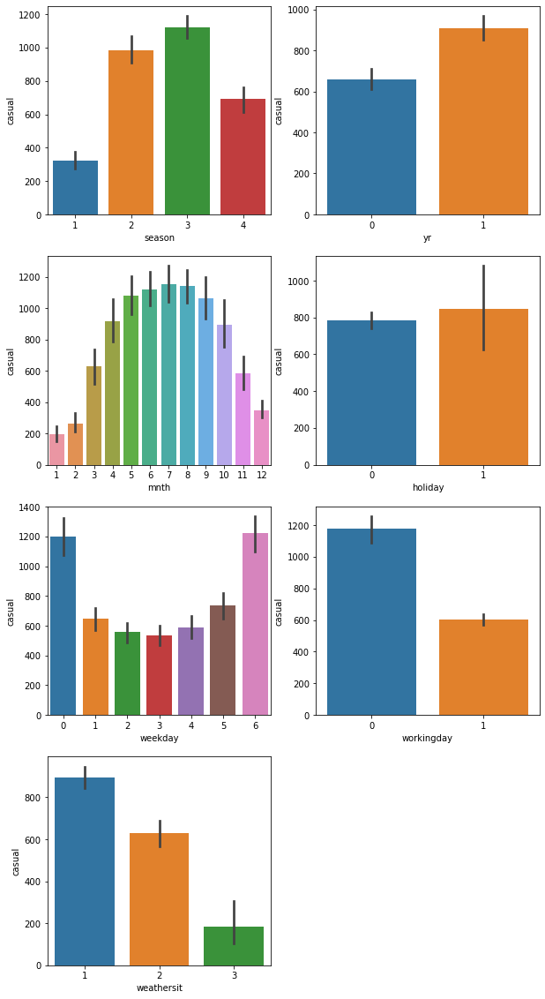

In [266]:
####Barplot For Casual variable
count = 1
plt.subplots(figsize=(10, 20))
for col in cat_data:
    plt.subplot(4, 2, count)
    sns.barplot(x = col, y = 'casual', data = dset)
    count += 1
plt.show()

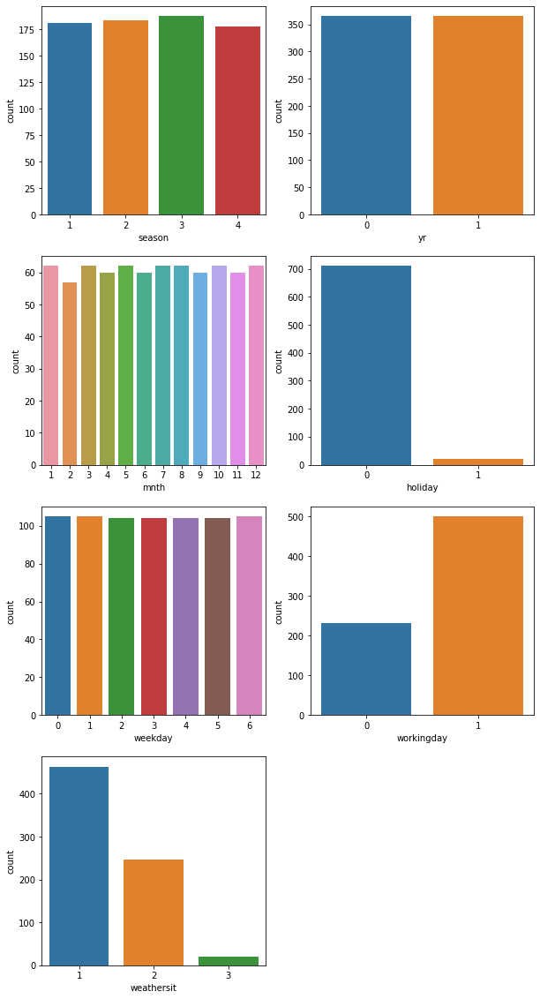

In [267]:
####Count plot for different features
count = 1
plt.subplots(figsize=(10, 20))
for col in cat_data:
    plt.subplot(4, 2, count)
    sns.countplot(x = col, data = dset)
    count += 1
plt.show()

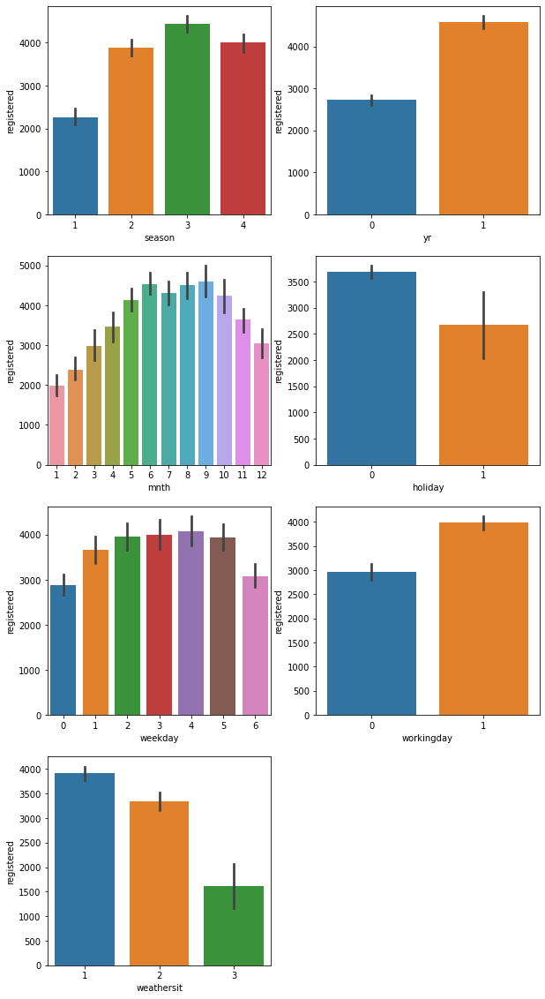

In [268]:
#####Barplot for Registered variable
count = 1
plt.subplots(figsize = (10, 20))
for col in cat_data.columns:
    plt.subplot(4, 2, count)
    sns.barplot(x = col, y = 'registered', data = dset)
    count += 1
    
plt.show()

In [28]:
######Checking vif to remove correlated variables
numerical_data = dset.select_dtypes(include=['int64', 'float64'])
vif_list = []
for i in range(len(numerical_data.columns[:-3])):
               vif_list.append(variance_inflation_factor(numerical_data.iloc[:, :-3].values, i))
vif_list

[490.85874570890854, 546.4545868635207, 11.690067018213067, 5.25335967247345]

In [29]:
vif_data = pd.DataFrame({'Feature':numerical_data.columns[:-3],
                         'VIF_value':vif_list})

In [271]:
vif_data

,Feature,VIF_value
0,temp,490.858746
1,atemp,546.454587
2,hum,11.690067
3,windspeed,5.253360


In [30]:
#####Feature Selection#####
######Dropping Variables#####
numerical_data.drop(['atemp', 'hum'], inplace=True, axis = 1)

C:\Users\Mayank\anaconda3\lib\site-packages\pandas\core\frame.py:3990: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().drop(


In [31]:
######Feature Engineering for month variable
def month_new(x):
    if((x >= 5) & (x <= 10)): return 'Peak_Months'
    else: return 'Regular'


    

In [32]:
dset['month_new'] = dset['mnth'].apply(month_new)
dset['month_new'] = pd.Categorical(dset.month_new, ordered=False)

In [33]:
dset.drop(['mnth'], inplace=True, axis=1)

In [39]:
#######ANOVA for categorical data
cat_data = dset.select_dtypes(include=['category'])
print(cat_data.columns)
p_value = []

Index(['season', 'yr', 'holiday', 'weekday', 'workingday', 'weathersit',
       'month_new'],
      dtype='object')


In [35]:
for col in cat_data.columns:
    mod = ols('casual ~ {}'.format(col), data = dset).fit()
    aov_table = sm.stats.anova_lm(mod, typ=2)
#     print(aov_table)
    p_value.append(aov_table.iloc[0, 3])

# p_value

In [36]:
aov_data_cas = pd.DataFrame({'Feature_Name': cat_data.columns,
                         'P_Values': p_value})
aov_data_cas

,Feature_Name,P_Values
0,season,3.685891e-58
1,yr,7.317009e-10
2,holiday,5.966379e-01
3,weekday,9.774881e-43
4,workingday,3.802807e-44
5,weathersit,5.622436e-15
6,month_new,4.735811e-54


In [40]:
for col in cat_data.columns:
    mod = ols('registered ~ {}'.format(col), data = dset).fit()
    aov_table = sm.stats.anova_lm(mod, typ=2)
#     print(aov_table)
    p_value.append(aov_table.iloc[0, 3])


In [41]:
aov_data_rgd = pd.DataFrame({'Feature_Name': cat_data.columns,
                         'P_Values': p_value})
aov_data_rgd

,Feature_Name,P_Values
0,season,3.425064e-51
1,yr,5.469676e-71
2,holiday,3.241687e-03
3,weekday,2.518809e-11
4,workingday,4.381571e-17
5,weathersit,8.329800e-14
6,month_new,2.354856e-41


In [42]:
dset = pd.concat([numerical_data, cat_data], axis=1)

In [43]:
dset.profile_report()

In [45]:
#######Transforming target variables by taking log####
dset['casual_log'] = dset['casual'].apply(np.log)
dset['cnt_log'] = dset['cnt'].apply(np.log)
dset['registered_log'] = dset['registered'].apply(np.log)

In [46]:
dset.describe()

,temp,windspeed,casual,registered,cnt,casual_log,cnt_log,registered_log
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,0.495385,0.186535,784.895212,3656.172367,4441.067579,6.317372,8.273384,8.080812
std,0.183051,0.071263,553.245742,1560.256377,1869.444464,0.976211,0.575296,0.565355
min,0.059130,0.022392,2.000000,20.000000,22.000000,0.693147,3.091042,2.995732
25%,0.337083,0.134646,315.500000,2497.000000,3152.000000,5.754157,8.055786,7.822844
50%,0.498333,0.179729,710.000000,3662.000000,4511.000000,6.565265,8.414274,8.205765
75%,0.655417,0.230098,1075.500000,4776.500000,5812.400000,6.980540,8.667748,8.471459
max,0.861667,0.378108,2258.000000,6946.000000,8173.000000,7.722235,9.008591,8.845921


In [48]:
#######Creating dummy variables
ohe_data = pd.get_dummies(data=dset, drop_first=True)
ohe_data

,temp,windspeed,casual,registered,cnt,casual_log,cnt_log,registered_log,season_2,season_3,...,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,workingday_1,weathersit_2,weathersit_3,month_new_Regular
0,0.344167,0.160446,331.0,654,985.0,5.802118,6.892642,6.483107,0,0,...,0,0,0,0,0,1,0,1,0,1
1,0.363478,0.248539,131.0,670,801.0,4.875197,6.685861,6.507278,0,0,...,0,0,0,0,0,0,0,1,0,1
2,0.196364,0.248309,120.0,1229,1349.0,4.787492,7.207119,7.113956,0,0,...,1,0,0,0,0,0,1,0,0,1
3,0.200000,0.160296,108.0,1454,1562.0,4.682131,7.353722,7.282074,0,0,...,0,1,0,0,0,0,1,0,0,1
4,0.226957,0.186900,82.0,1518,1600.0,4.406719,7.377759,7.325149,0,0,...,0,0,1,0,0,0,1,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
726,0.254167,0.350133,247.0,1867,2114.0,5.509388,7.656337,7.532088,0,0,...,0,0,0,1,0,0,1,1,0,1
727,0.253333,0.155471,644.0,2451,3095.0,6.467699,8.037543,7.804251,0,0,...,0,0,0,0,1,0,1,1,0,1
728,0.253333,0.124383,159.0,1182,1341.0,5.068904,7.201171,7.074963,0,0,...,0,0,0,0,0,1,0,1,0,1
729,0.255833,0.350754,364.0,1432,1796.0,5.897154,7.493317,7.266827,0,0,...,0,0,0,0,0,0,0,0,0,1


In [49]:
final_data = ohe_data.drop(['casual', 'registered'], axis =1)

In [50]:
final_data.describe()

,temp,windspeed,cnt,casual_log,cnt_log,registered_log,season_2,season_3,season_4,yr_1,...,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,workingday_1,weathersit_2,weathersit_3,month_new_Regular
count,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,...,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000,731.000000
mean,0.495385,0.186535,4441.067579,6.317372,8.273384,8.080812,0.251710,0.257182,0.243502,0.500684,...,0.143639,0.142271,0.142271,0.142271,0.142271,0.143639,0.683995,0.337893,0.028728,0.496580
std,0.183051,0.071263,1869.444464,0.976211,0.575296,0.565355,0.434293,0.437380,0.429489,0.500342,...,0.350963,0.349567,0.349567,0.349567,0.349567,0.350963,0.465233,0.473316,0.167155,0.500331
min,0.059130,0.022392,22.000000,0.693147,3.091042,2.995732,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.337083,0.134646,3152.000000,5.754157,8.055786,7.822844,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.498333,0.179729,4511.000000,6.565265,8.414274,8.205765,0.000000,0.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.655417,0.230098,5812.400000,6.980540,8.667748,8.471459,1.000000,1.000000,0.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
max,0.861667,0.378108,8173.000000,7.722235,9.008591,8.845921,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [51]:
#######Splitting Data########333
X_train, X_valid, Y_train, Y_valid  = train_test_split(final_data.iloc[:, final_data.columns != 'cnt'], final_data['cnt'],
                                                      test_size = 0.2, random_state =123)

In [52]:
###Preparing training data for target 'casual'
X_train_cas = X_train.drop(['casual_log', 'cnt_log', 'registered_log'], axis= 1)
Y_train_cas = X_train['casual_log']
X_valid_cas = X_valid.drop(['casual_log', 'cnt_log', 'registered_log'], axis = 1)
Y_valid_cas = X_valid['casual_log'] 

In [53]:
###Preparing training data for target 'registered'
X_train_rgd = X_train.drop(['casual_log', 'cnt_log', 'registered_log'], axis= 1)
Y_train_rgd = X_train['registered_log']
X_valid_rgd = X_valid.drop(['casual_log', 'cnt_log', 'registered_log'], axis= 1)
Y_valid_rgd = X_valid['registered_log']

In [54]:
X_valid_cas.describe()

,temp,windspeed,season_2,season_3,season_4,yr_1,holiday_1,weekday_1,weekday_2,weekday_3,weekday_4,weekday_5,weekday_6,workingday_1,weathersit_2,weathersit_3,month_new_Regular
count,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000
mean,0.506649,0.184872,0.238095,0.251701,0.278912,0.482993,0.027211,0.156463,0.156463,0.102041,0.163265,0.156463,0.122449,0.707483,0.333333,0.020408,0.462585
std,0.181984,0.069988,0.427374,0.435474,0.449997,0.501419,0.163254,0.364535,0.364535,0.303737,0.370871,0.364535,0.328924,0.456474,0.473016,0.141875,0.500303
min,0.150000,0.022392,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.354583,0.136825,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.512500,0.174746,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
75%,0.658750,0.228858,0.000000,0.500000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000
max,0.861667,0.365671,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [64]:
#######Evaluation Metrics Function########3
def metrics(train_pred, valid_pred, y_train, y_valid):
    
    # Root mean squared error
    train_rmse = np.sqrt(mean_squared_error(y_train, train_pred))
    valid_rmse = np.sqrt(mean_squared_error(y_valid, valid_pred))
    
    # Calculate absolute percentage error
    train_ape = abs((y_train - train_pred) / y_train)
    valid_ape = abs((y_valid - valid_pred) / y_valid)
    
    # Account for y values of 0
    train_ape[train_ape == np.inf] = 0
    train_ape[train_ape == -np.inf] = 0
    valid_ape[valid_ape == np.inf] = 0
    valid_ape[valid_ape == -np.inf] = 0
    
    train_mape = 100 * np.mean(train_ape)
    valid_mape = 100 * np.mean(valid_ape)
    
    print(f'Training:   rmse = {round(train_rmse, 2)} \t mape = {round(train_mape, 2)}')
    print(f'Validation: rmse = {round(valid_rmse, 2)} \t mape = {round(valid_mape, 2)}')
    
    


def evaluate(model, X_train, X_valid, y_train, y_valid):
    
    # Make predictions
    train_pred = model.predict(X_train)
    valid_pred = model.predict(X_valid)
    
    # Get metrics
    metrics(train_pred, valid_pred, y_train, y_valid)
    return train_pred, valid_pred


In [65]:
#######LINEAR REGRESSION#########
lr = LinearRegression()

In [69]:
lr_cas = lr.fit(X_train_cas, Y_train_cas)
train_pred_cas, valid_pred_cas = evaluate(lr_cas, X_train_cas, X_valid_cas, Y_train_cas, Y_valid_cas)

Training:   rmse = 0.46 	 mape = 6.55
Validation: rmse = 0.47 	 mape = 6.02


In [70]:
lr_rgd = lr.fit(X_train_rgd, Y_train_rgd)
train_pred_rgd, valid_pred_rgd = evaluate(lr_rgd, X_train_rgd, X_valid_rgd, Y_train_rgd, Y_valid_rgd)

Training:   rmse = 0.3 	 mape = 2.4
Validation: rmse = 0.25 	 mape = 2.32


In [75]:
train_pred = np.add(np.exp(train_pred_cas), np.exp(train_pred_rgd))
valid_pred = np.add(np.exp(valid_pred_cas), np.exp(valid_pred_rgd))
metrics(train_pred, valid_pred, Y_train, Y_valid)

Training:   rmse = 918.64 	 mape = 31.55
Validation: rmse = 1052.23 	 mape = 19.86


In [76]:
###############RANDOM FOREST########3
rf = RandomForestRegressor(random_state=123)

In [77]:
rf_cas = rf.fit(X_train_cas, Y_train_cas)
train_pred_cas_rf, valid_pred_cas_rf = evaluate(rf_cas, X_train_cas, X_valid_cas, Y_train_cas, Y_valid_cas)

Training:   rmse = 0.17 	 mape = 2.46
Validation: rmse = 0.42 	 mape = 5.27


In [78]:
rf_rgd = rf.fit(X_train_rgd, Y_train_rgd)
train_pred_rgd_rf, valid_pred_rgd_rf = evaluate(rf_rgd, X_train_rgd, X_valid_rgd, Y_train_rgd, Y_valid_rgd)

Training:   rmse = 0.12 	 mape = 0.86
Validation: rmse = 0.26 	 mape = 2.17


In [79]:
train_pred_rf = np.add(np.exp(train_pred_cas_rf), np.exp(train_pred_rgd_rf))
valid_pred_rf = np.add(np.exp(valid_pred_cas_rf), np.exp(valid_pred_rgd_rf))
metrics(train_pred_rf, valid_pred_rf, Y_train, Y_valid)

Training:   rmse = 279.35 	 mape = 6.9
Validation: rmse = 850.6 	 mape = 17.13


In [87]:
#######Hyperparameter Tuning#########
random_grid = {'n_estimators': range(100,500,100),
               'max_depth': range(5,20,1),
               'min_samples_leaf':range(2,5,1),
               'max_features':['auto','sqrt','log2'],
               'bootstrap': [True, False],
               'min_samples_split': range(2,5,1)}

In [93]:
rf_cas_cv = RandomizedSearchCV(rf_cas, random_grid, cv=5, scoring ='neg_root_mean_squared_error', random_state=123)
rf_cas_cv.fit(X_train_cas, Y_train_cas)
print("Tuned Random Forest Parameters: {}".format(rf_cas_cv.best_params_))
print("Best score is {}".format(rf_cas_cv.best_score_))

Tuned Random Forest Parameters: {'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 19, 'bootstrap': True}
Best score is -0.45914579067003797


In [91]:
#######Training using best parameters#########
hy_rf_cas = RandomForestRegressor(n_estimators = 200, 
                               min_samples_split = 4, 
                               min_samples_leaf = 2, 
                               max_features = 'log2', 
                               max_depth = 19, 
                               bootstrap = True, random_state=123)
hy_rf_cas.fit(X_train_cas, Y_train_cas)
hy_train_pred_cas_rf, hy_valid_pred_cas_rf = evaluate(hy_rf_cas, X_train_cas, X_valid_cas, Y_train_cas, Y_valid_cas)

Training:   rmse = 0.32 	 mape = 4.44
Validation: rmse = 0.43 	 mape = 5.48


In [94]:
rf_rgd_cv = RandomizedSearchCV(rf_rgd, random_grid, cv=5, scoring ='neg_root_mean_squared_error', random_state=123)
rf_rgd_cv.fit(X_train_rgd, Y_train_rgd)
print("Tuned Random Forest Parameters: {}".format(rf_rgd_cv.best_params_))
print("Best score is {}".format(rf_rgd_cv.best_score_))

Tuned Random Forest Parameters: {'n_estimators': 200, 'min_samples_split': 4, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 19, 'bootstrap': True}
Best score is -0.30154951774938304


In [95]:
hy_rf_rgd = RandomForestRegressor(n_estimators = 200, 
                               min_samples_split = 4, 
                               min_samples_leaf = 2, 
                               max_features = 'log2', 
                               max_depth = 19, 
                               bootstrap = True, random_state=123)
hy_rf_rgd.fit(X_train_rgd, Y_train_rgd)
hy_train_pred_rgd_rf, hy_valid_pred_rgd_rf = evaluate(hy_rf_rgd, X_train_rgd, X_valid_rgd, Y_train_rgd, Y_valid_rgd)

Training:   rmse = 0.22 	 mape = 1.57
Validation: rmse = 0.25 	 mape = 2.13


In [96]:
hy_train_pred_rf = np.add(np.exp(hy_train_pred_cas_rf), np.exp(hy_train_pred_rgd_rf))
hy_valid_pred_rf = np.add(np.exp(hy_valid_pred_cas_rf), np.exp(hy_valid_pred_rgd_rf))
metrics(hy_train_pred_rf, hy_valid_pred_rf, Y_train, Y_valid)

Training:   rmse = 513.51 	 mape = 16.48
Validation: rmse = 840.31 	 mape = 17.72


In [82]:
#######Extreme Gradient Boosting########3
xg = XGBRegressor()

In [83]:
xg_cas = xg.fit(X_train_cas, Y_train_cas)
train_pred_cas_xg, valid_pred_cas_xg = evaluate(xg_cas, X_train_cas, X_valid_cas, Y_train_cas, Y_valid_cas)

Training:   rmse = 0.02 	 mape = 0.28
Validation: rmse = 0.45 	 mape = 5.53


In [84]:
xg_rgd = xg.fit(X_train_rgd, Y_train_rgd)
train_pred_rgd_xg, valid_pred_rgd_xg = evaluate(xg_rgd, X_train_rgd, X_valid_rgd, Y_train_rgd, Y_valid_rgd)

Training:   rmse = 0.01 	 mape = 0.1
Validation: rmse = 0.25 	 mape = 2.16


In [85]:
train_pred_xg = np.add(np.exp(train_pred_cas_xg), np.exp(train_pred_rgd_xg))
valid_pred_xg = np.add(np.exp(valid_pred_cas_xg), np.exp(valid_pred_rgd_xg))
metrics(train_pred_xg, valid_pred_xg, Y_train, Y_valid)

Training:   rmse = 52.66 	 mape = 0.8
Validation: rmse = 755.06 	 mape = 16.48


In [97]:
#######Hyperparameter Tuning#######
params = {'objective':['reg:linear'],
          'n_estimators': range(100,3000,100),
          'max_depth': range(3,10,1),
          'subsample': np.arange(0.1,1,0.1),
          'colsample_bytree': np.arange(0.1,1,0.1),
          'colsample_bylevel': np.arange(0.1,1,0.1),
          'colsample_bynode': np.arange(0.1,1,0.1),
          'learning_rate': np.arange(0.05, 0.3, 0.05)}


In [98]:
p_search_cas = RandomizedSearchCV(xg_cas, params, cv=5, scoring='neg_root_mean_squared_error', random_state=123)
p_search_cas.fit(X_train_cas, Y_train_cas)


[22:13:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:38] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:13:39] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:17

[22:14:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:14:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:14:03] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:14:04] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1, gamma=0,
                                          gpu_id=-1, importance_type='gain',
                                          interaction_constraints='',
                                          learning_rate=0.300000012,
                                          max_delta_step=0, max_depth=6,
                                          min_child_weight=1, missing=nan,
                                          monotone_constraints='()',
                                          n_estimators=100, n_jobs=8,
                                          num_par...
                                        'colsample_bynode': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                 

In [99]:
print("Tuned XGBoost Parameters: {}".format(p_search_cas.best_params_))
print("Best score is {}".format(p_search_cas.best_score_))

Tuned XGBoost Parameters: {'subsample': 0.2, 'objective': 'reg:linear', 'n_estimators': 800, 'max_depth': 4, 'learning_rate': 0.05, 'colsample_bytree': 0.6, 'colsample_bynode': 0.2, 'colsample_bylevel': 0.5}
Best score is -0.4378200767706292


In [101]:
hy_xg_cas = xgb.XGBRegressor(objective ="reg:linear", colsample_bytree = 0.6, learning_rate = 0.05, 
                     max_depth = 4, n_estimators = 800, colsample_bynode = 0.2, 
                     colsample_bylevel=0.5, subsample =  0.2)
hy_xg_cas.fit(X_train_cas, Y_train_cas)

hy_train_pred_cas_xg, hy_valid_pred_cas_xg = evaluate(hy_xg_cas, X_train_cas, X_valid_cas, Y_train_cas, Y_valid_cas)

[22:18:01] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
Training:   rmse = 0.32 	 mape = 4.36
Validation: rmse = 0.39 	 mape = 5.04


In [102]:
p_search_rgd = RandomizedSearchCV(xg_rgd, params, cv=5, scoring='neg_root_mean_squared_error', random_state=123)
p_search_rgd.fit(X_train_rgd, Y_train_rgd)


[22:19:25] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:19:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:19:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:19:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:19:26] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:19:27] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:17

[22:19:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:19:49] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:19:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
[22:19:50] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=0.5, booster='gbtree',
                                          colsample_bylevel=1,
                                          colsample_bynode=1,
                                          colsample_bytree=1, gamma=0,
                                          gpu_id=-1, importance_type='gain',
                                          interaction_constraints='',
                                          learning_rate=0.300000012,
                                          max_delta_step=0, max_depth=6,
                                          min_child_weight=1, missing=nan,
                                          monotone_constraints='()',
                                          n_estimators=100, n_jobs=8,
                                          num_par...
                                        'colsample_bynode': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                 

In [103]:
print("Tuned XGBoost Parameters: {}".format(p_search_rgd.best_params_))
print("Best score is {}".format(p_search_rgd.best_score_))

Tuned XGBoost Parameters: {'subsample': 0.5, 'objective': 'reg:linear', 'n_estimators': 700, 'max_depth': 8, 'learning_rate': 0.05, 'colsample_bytree': 0.8, 'colsample_bynode': 0.30000000000000004, 'colsample_bylevel': 0.9}
Best score is -0.2951909751095095


In [104]:
hy_xg_rgd = xgb.XGBRegressor(objective ="reg:linear", colsample_bytree = 0.8, learning_rate = 0.05, 
                     max_depth = 8, n_estimators = 700, colsample_bynode = 0.30000000000000004, 
                     colsample_bylevel=0.9, subsample =  0.5)
hy_xg_rgd.fit(X_train_rgd, Y_train_rgd)

hy_train_pred_rgd_xg, hy_valid_pred_rgd_xg = evaluate(hy_xg_rgd, X_train_rgd, X_valid_rgd, Y_train_rgd, Y_valid_rgd)

[22:23:13] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.3.0/src/objective/regression_obj.cu:170: reg:linear is now deprecated in favor of reg:squarederror.
Training:   rmse = 0.03 	 mape = 0.24
Validation: rmse = 0.22 	 mape = 1.87


In [105]:
hy_train_pred_xg = np.add(np.exp(hy_train_pred_cas_xg), np.exp(hy_train_pred_rgd_xg))
hy_valid_pred_xg = np.add(np.exp(hy_valid_pred_cas_xg), np.exp(hy_valid_pred_rgd_xg))
metrics(hy_train_pred_xg, hy_valid_pred_xg, Y_train, Y_valid)

Training:   rmse = 235.51 	 mape = 4.32
Validation: rmse = 737.15 	 mape = 14.69
